# Load and import the necessary dependencies

In [1]:
# Check nvcc version
!nvcc -V
# Check GCC version
!gcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Wed_Jul_22_19:09:09_PDT_2020
Cuda compilation tools, release 11.0, V11.0.221
Build cuda_11.0_bu.TC445_37.28845127_0
gcc (Ubuntu 9.4.0-1ubuntu1~20.04.1) 9.4.0
Copyright (C) 2019 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [2]:
!pip install -U openmim
!mim install mmcv-full

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.4/50.4 kB 196.1 kB/s eta 0:00:00a 0:00:01
Looking in links: https://download.openmmlab.com/mmcv/dist/cu110/torch1.11.0/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 593.6/593.6 kB 737.5 kB/s eta 0:00:00a 0:00:01
  Preparing metadata (setup.py) ... done
  Created wheel for mmcv-full: filename=mmcv_full-1.7.0-cp37-cp37m-linux_x86_64.whl size=29904619 sha256=bc440eda094e558f71ebe2e45ed9af2d9711b0a331559bc17ca658b05afd05a9
  Stored in directory: /root/.cache/pip/wheels/d8/a3/6c/d150cb09404e0c2a4c83c871e4b140476da612de692df7c04c
Successfully built mmcv-full


In [3]:
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection
!pip install -e .
# "-v" means verbose, or more output
# "-e" means installing a project in editable mode,
# thus any local modifications made to the code will take effect without reinstallation.

Cloning into 'mmdetection'...
remote: Enumerating objects: 33160, done.
remote: Counting objects: 100% (166/166), done.
remote: Compressing objects: 100% (145/145), done.
remote: Total 33160 (delta 57), reused 74 (delta 21), pack-reused 32994
Receiving objects: 100% (33160/33160), 45.11 MiB | 11.75 MiB/s, done.
Resolving deltas: 100% (23405/23405), done.
/kaggle/working/mmdetection
Obtaining file:///kaggle/working/mmdetection
  Preparing metadata (setup.py) ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for pycocotools: filename=pycocotools-2.0.6-cp37-cp37m-linux_x86_64.whl size=373767 sha256=9209cb36ed92facb7f3012ea0554934eb43a525ae9894ae62ae1de3ca4900281
  Stored in directory: /root/.cache/pip/wheels/06/f6/f9/9cc49c6de8e3cf27dfddd91bf46595a057141d4583a2adaf03
Successfully built pycocotools
  Running setup.py develop for mmdet


In [4]:
# Check Pytorch installation
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

# Check MMDetection installation
import mmdet
print(mmdet.__version__)

# Check mmcv installation
from mmcv.ops import get_compiling_cuda_version, get_compiler_version
print(get_compiling_cuda_version())
print(get_compiler_version())

1.11.0 True


/opt/conda/lib/python3.7/site-packages/mmcv/__init__.py:21: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  'On January 1, 2023, MMCV will release v2.0.0, in which it will remove '


2.26.0
11.0
GCC 9.4


In [5]:
import json
import os
import numpy as np

In [6]:
path = '/kaggle/input/russian-road-signs-segmentation-dataset/sign_dataset/'
(len(os.listdir(path + 'train/')) - 1) / 2, (len(os.listdir(path + 'val/')) - 1) / 2

(2054.0, 127.0)

In [7]:
folder = '/kaggle/input/russian-road-signs-segmentation-dataset/sign_dataset/train'

with open(f'{folder}/via_region_data.json') as annot:
    all_annotation = json.load(annot)

In [26]:
list(all_annotation.values())[0]

{'fileref': '',
 'size': 51781,
 'filename': '2050.jpg',
 'base64_img_data': '',
 'file_attributes': {'width': 1280, 'height': 720},
 'regions': {'0': {'shape_attributes': {'name': 'polygon',
    'all_points_x': [1226, 1247, 1268, 1226],
    'all_points_y': [275, 232, 275, 275]},
   'region_attributes': {'name': 'road sign'}},
  '1': {'shape_attributes': {'name': 'polygon',
    'all_points_x': [1230, 1275, 1275, 1230, 1230],
    'all_points_y': [278, 278, 299, 299, 278]},
   'region_attributes': {'name': 'road sign'}},
  '2': {'shape_attributes': {'name': 'polygon',
    'all_points_x': [1254, 1259, 1252, 1249, 1254],
    'all_points_y': [302, 368, 369, 305, 302]},
   'region_attributes': {}}}}

# Checking unique object shapes

In [9]:
unique_figures = []
for image in all_annotation.keys():
    for num in all_annotation[image]['regions'].keys():
        figure = all_annotation[image]['regions'][num]['shape_attributes']['name']
        unique_figures.append(figure)
print(f'Unique figures: {set(unique_figures)}')

Unique figures: {'ellipse', 'circle', 'rect', 'polygon'}


# Converting annotation file to COCO format

In [14]:
import os.path as osp
import mmcv

def polygon_to_poly(xs, ys):
    poly = list(zip(xs, ys))
    if poly[0] == poly[-1]:
        poly = poly[:-1]
    return poly

def rectangle_to_poly(x, y, w, h):
    return [(x, y), (x + w, y), (x + w, y + h), (x, y + h)]

def circle_to_poly(cx, cy, r):
    return [(cx + r * np.cos(a), cy - r * np.sin(a)) for a in np.arange(0, 2 * np.pi, 0.1)]

def ellipse_to_poly(cx, cy, rx, ry):
    return [(cx + rx * np.cos(a), cy - ry * np.sin(a)) for a in np.arange(0, 2 * np.pi, 0.1)]

def polygon_area(xs, ys):
    return 0.5 * np.abs(np.dot(xs, np.roll(ys, 1)) - np.dot(ys, np.roll(xs, 1)))

def convert_sign_to_coco(ann_file, out_file):
    data_infos = mmcv.load(ann_file)

    annotations = []
    images = []
    obj_count = 0
    for idx, anno in enumerate(mmcv.track_iter_progress(data_infos.values())):
        
        filename = anno['filename']
        height, width = anno['file_attributes']['height'], anno['file_attributes']['width']

        images.append(dict(
            id=idx,
            file_name=filename,
            height=height,
            width=width))

        for region in anno['regions'].values():       
            shape_attr = region['shape_attributes']
            if shape_attr['name'] == 'circle':
                cx, cy, r = (shape_attr['cx'], shape_attr['cy'], shape_attr['r'])
                poly = circle_to_poly(cx, cx, r)
                area = np.pi * r ** 2
                
            elif shape_attr['name'] == 'polygon':
                xs, ys = (shape_attr['all_points_x'], shape_attr['all_points_y'])
                poly = polygon_to_poly(xs, ys)
                area = polyhon_area(xs, ys)
                
            elif shape_attr['name'] == 'ellipse':
                cx, cy, rx, ry = (shape_attr['cx'], shape_attr['cy'], shape_attr['rx'], shape_attr['ry'])
                poly = ellipse_to_poly(cx, cy, rx, ry)
                area = np.pi * rx * ry
                
            elif shape_attr['name'] == 'rect':
                x, y, h, w = (shape_attr['x'], shape_attr['y'], shape_attr['height'], shape_attr['width'])
                poly = rectangle_to_poly(x, y, w, h)
                area = h * w
            
            poly = np.array(poly)
            x_min, y_min, x_max, y_max = (
                int(min(poly[:, 0])),
                int(min(poly[:, 1])),
                int(max(poly[:, 0])),
                int(max(poly[:, 1]))
                )
            poly = [p for x in poly for p in x]

            data_anno = dict(
                image_id=idx,
                id=obj_count,
                category_id=0,
                bbox=[x_min, y_min, x_max - x_min, y_max - y_min],
                area=area,
                segmentation=[poly],
                iscrowd=0)
            annotations.append(data_anno)
            obj_count += 1

    coco_format_json = dict(
        images=images,
        annotations=annotations,
        categories=[{'id':0, 'name': 'road_sign'}])
    mmcv.dump(coco_format_json, out_file)

In [14]:
convert_sign_to_coco(f'{path}/train/via_region_data.json',
                     'train_annotation_coco.json')
convert_sign_to_coco(f'{path}/val/via_region_data.json',
                     'val_annotation_coco.json')

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2054/2054, 783.6 task/s, elapsed: 3s, ETA:     0s
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 127/127, 684.5 task/s, elapsed: 0s, ETA:     0s


# Check that the annotation file works

loading annotations into memory...
Done (t=0.07s)
creating index...
index created!


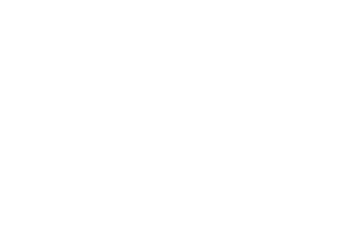

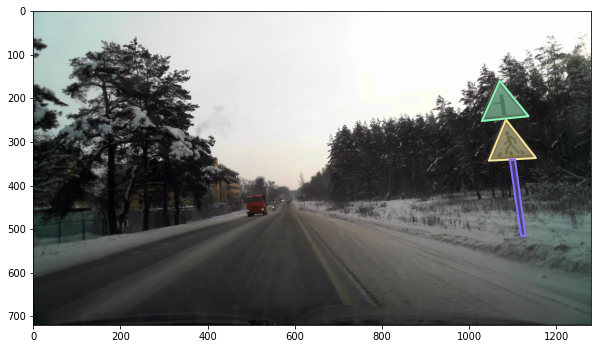

In [15]:
import matplotlib.pyplot as plt
from pycocotools.coco import COCO
import skimage.io as io

coco = COCO('/kaggle/working/mmdetection/train_annotation_coco.json')
imgIds = coco.getImgIds()
img = coco.loadImgs(imgIds[np.random.randint(0, len(imgIds))])[0]
I = io.imread(folder + '/' + img['file_name'])
plt.axis('off')
plt.figure(figsize=(10, 10))
plt.imshow(I)

coco.showAnns(coco.loadAnns(coco.getAnnIds(imgIds=img['id'])), draw_bbox=False)
plt.show()

# Loading weights of the pre-trained model

In [16]:
!mkdir checkpoints
!wget -c https://download.openmmlab.com/mmdetection/v2.0/mask_rcnn/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco_bbox_mAP-0.408__segm_mAP-0.37_20200504_163245-42aa3d00.pth \
      -O checkpoints/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco_bbox_mAP-0.408__segm_mAP-0.37_20200504_163245-42aa3d00.pth

--2022-12-22 11:15:26--  https://download.openmmlab.com/mmdetection/v2.0/mask_rcnn/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco_bbox_mAP-0.408__segm_mAP-0.37_20200504_163245-42aa3d00.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 8.38.121.212, 8.38.121.209, 8.38.121.214, ...
Connecting to download.openmmlab.com (download.openmmlab.com)|8.38.121.212|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 177867103 (170M) [application/octet-stream]
Saving to: ‘checkpoints/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco_bbox_mAP-0.408__segm_mAP-0.37_20200504_163245-42aa3d00.pth’

checkpoints/mask_rc 100%[===================>] 169.63M  2.42MB/s    in 70s     

2022-12-22 11:16:41 (2.41 MB/s) - ‘checkpoints/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco_bbox_mAP-0.408__segm_mAP-0.37_20200504_163245-42aa3d00.pth’ saved [177867103/177867103]



# Loading and changing the config

In [17]:
from mmcv import Config
cfg = Config.fromfile('./configs/mask_rcnn/mask_rcnn_r50_caffe_fpn_mstrain-poly_1x_coco.py')

In [18]:
from mmdet.apis import set_random_seed

device='cuda:0'

cfg.device = 'cuda'
# Modify dataset type and path
cfg.dataset_type = 'COCODataset'

cfg.data.test.ann_file = '/kaggle/working/mmdetection/val_annotation_coco.json'
cfg.data.test.img_prefix = path + 'val/'
cfg.data.test.classes = ('road_sign',)

cfg.data.train.ann_file = '/kaggle/working/mmdetection/train_annotation_coco.json'
cfg.data.train.img_prefix = path + 'train/'
cfg.data.train.classes = ('road_sign',)


cfg.data.val.ann_file = '/kaggle/working/mmdetection/val_annotation_coco.json'
cfg.data.val.img_prefix = path + 'val/'
cfg.data.val.classes = ('road_sign',)

# modify num classes of the model in box head and mask head
cfg.model.roi_head.bbox_head.num_classes = 1
cfg.model.roi_head.mask_head.num_classes = 1

# We can still the pre-trained Mask RCNN model to obtain a higher performance
cfg.load_from = 'checkpoints/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco_bbox_mAP-0.408__segm_mAP-0.37_20200504_163245-42aa3d00.pth'

# Set up working dir to save files and logs.
cfg.work_dir = '/kaggle/working/training_exps'

# The original learning rate (LR) is set for 8-GPU training.
# We divide it by 8 since we only use one GPU.
cfg.optimizer.lr = 0.02 / 8
cfg.lr_config.warmup = None
cfg.log_config.interval = 257

# We can set the evaluation interval to reduce the evaluation times
cfg.evaluation.interval = 2
# We can set the checkpoint saving interval to reduce the storage cost
cfg.checkpoint_config.interval = 2
cfg.runner.max_epochs = 6
# Set seed thus the results are more reproducible
cfg.seed = 0
set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)

# We can also use tensorboard to log the training process
cfg.log_config.hooks = [
    dict(type='TextLoggerHook'),
    dict(type='TensorboardLoggerHook')]

# We can initialize the logger for training and have a look
# at the final config used for training
print(f'Config:\n{cfg.pretty_text}')


Config:
model = dict(
    type='MaskRCNN',
    backbone=dict(
        type='ResNet',
        depth=50,
        num_stages=4,
        out_indices=(0, 1, 2, 3),
        frozen_stages=1,
        norm_cfg=dict(type='BN', requires_grad=False),
        norm_eval=True,
        style='caffe',
        init_cfg=dict(
            type='Pretrained',
            checkpoint='open-mmlab://detectron2/resnet50_caffe')),
    neck=dict(
        type='FPN',
        in_channels=[256, 512, 1024, 2048],
        out_channels=256,
        num_outs=5),
    rpn_head=dict(
        type='RPNHead',
        in_channels=256,
        feat_channels=256,
        anchor_generator=dict(
            type='AnchorGenerator',
            scales=[8],
            ratios=[0.5, 1.0, 2.0],
            strides=[4, 8, 16, 32, 64]),
        bbox_coder=dict(
            type='DeltaXYWHBBoxCoder',
            target_means=[0.0, 0.0, 0.0, 0.0],
            target_stds=[1.0, 1.0, 1.0, 1.0]),
        loss_cls=dict(
            type='Cross

# Model training

In [19]:
from mmdet.datasets import build_dataset
from mmdet.models import build_detector
from mmdet.apis import train_detector


# Build dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_detector(cfg.model)

# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_detector(model, datasets, cfg, distributed=False, validate=True)

loading annotations into memory...
Done (t=0.07s)
creating index...
index created!


2022-12-22 11:16:47,656 - mmdet - INFO - Automatic scaling of learning rate (LR) has been disabled.
2022-12-22 11:16:47,669 - mmdet - INFO - load checkpoint from local path: checkpoints/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco_bbox_mAP-0.408__segm_mAP-0.37_20200504_163245-42aa3d00.pth
2022-12-22 11:16:47,840 - mmdet - WARNING - The model and loaded state dict do not match exactly

size mismatch for roi_head.bbox_head.fc_cls.weight: copying a param with shape torch.Size([81, 1024]) from checkpoint, the shape in current model is torch.Size([2, 1024]).
size mismatch for roi_head.bbox_head.fc_cls.bias: copying a param with shape torch.Size([81]) from checkpoint, the shape in current model is torch.Size([2]).
size mismatch for roi_head.bbox_head.fc_reg.weight: copying a param with shape torch.Size([320, 1024]) from checkpoint, the shape in current model is torch.Size([4, 1024]).
size mismatch for roi_head.bbox_head.fc_reg.bias: copying a param with shape torch.Size([320]) from checkpoin

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!


2022-12-22 11:18:27,041 - mmdet - INFO - Epoch [1][257/1028]	lr: 2.500e-03, eta: 0:36:33, time: 0.371, data_time: 0.018, memory: 3529, loss_rpn_cls: 0.0193, loss_rpn_bbox: 0.0155, loss_cls: 0.0826, acc: 96.8967, loss_bbox: 0.1202, loss_mask: 0.2099, loss: 0.4475
2022-12-22 11:19:52,997 - mmdet - INFO - Epoch [1][514/1028]	lr: 2.500e-03, eta: 0:33:14, time: 0.334, data_time: 0.010, memory: 3529, loss_rpn_cls: 0.0082, loss_rpn_bbox: 0.0137, loss_cls: 0.0672, acc: 97.3735, loss_bbox: 0.1109, loss_mask: 0.1815, loss: 0.3814
2022-12-22 11:21:19,143 - mmdet - INFO - Epoch [1][771/1028]	lr: 2.500e-03, eta: 0:31:12, time: 0.335, data_time: 0.010, memory: 3529, loss_rpn_cls: 0.0114, loss_rpn_bbox: 0.0161, loss_cls: 0.0630, acc: 97.5320, loss_bbox: 0.1041, loss_mask: 0.1748, loss: 0.3694
2022-12-22 11:22:44,810 - mmdet - INFO - Epoch [1][1028/1028]	lr: 2.500e-03, eta: 0:29:25, time: 0.333, data_time: 0.010, memory: 3529, loss_rpn_cls: 0.0079, loss_rpn_bbox: 0.0141, loss_cls: 0.0611, acc: 97.5616

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 127/127, 6.0 task/s, elapsed: 21s, ETA:     0s

2022-12-22 11:28:53,154 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*


2022-12-22 11:28:53,335 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.616
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.894
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.720
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.606
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.641
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.634
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.695
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.695
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.695
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.659
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.739
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.14s).
Accumulating evaluation results...
DONE (t=0.04s).
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *segm*


2022-12-22 11:28:53,544 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.552
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.851
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.648
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.486
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.638
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.571
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.618
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.618
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.618
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.563
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.682
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.16s).
Accumulating evaluation results...
DONE (t=0.03s).


/kaggle/working/mmdetection/mmdet/core/mask/structures.py:1071: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bitmap_mask = maskUtils.decode(rle).astype(np.bool)
2022-12-22 11:30:22,014 - mmdet - INFO - Epoch [3][257/1028]	lr: 2.500e-03, eta: 0:21:51, time: 0.344, data_time: 0.019, memory: 3581, loss_rpn_cls: 0.0044, loss_rpn_bbox: 0.0117, loss_cls: 0.0562, acc: 97.7778, loss_bbox: 0.1006, loss_mask: 0.1623, loss: 0.3352
2022-12-22 11:31:48,351 - mmdet - INFO - Epoch [3][514/1028]	lr: 2.500e-03, eta: 0:20:22, time: 0.336, data_time: 0.010, memory: 3581, loss_rpn_cls: 0.0033, loss_rpn_bbox: 0.0108, loss_cls: 0.0512, acc: 97.8801, loss_bbox: 0.0990, loss_mask: 0.1548, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 127/127, 6.9 task/s, elapsed: 18s, ETA:     0s

/opt/conda/lib/python3.7/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f3a44ec7ad0>
  self.pid = os.fork()
/opt/conda/lib/python3.7/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f3a44ec7520>
  self.pid = os.fork()
/opt/conda/lib/python3.7/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f3a44ec7ad0>
  self.pid = os.fork()
/opt/conda/lib/python3.7/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f3a44ec7520>
  self.pid = os.fork()
2022-12-22 11:40:45,001 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.19s).
Accumulating evaluation results...


2022-12-22 11:40:45,267 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.631
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.895
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.766
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.636
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.640
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.624
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.698
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.698
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.698
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.681
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.723
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.06s).
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *segm*


/kaggle/working/mmdetection/mmdet/datasets/coco.py:474: UserWarning: The key "bbox" is deleted for more accurate mask AP of small/medium/large instances since v2.12.0. This does not change the overall mAP calculation.
  UserWarning)
2022-12-22 11:40:45,446 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.563
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.873
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.653
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.525
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.614
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.583
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.627
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.627
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.627

DONE (t=0.13s).
Accumulating evaluation results...
DONE (t=0.03s).


/kaggle/working/mmdetection/mmdet/core/mask/structures.py:1071: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bitmap_mask = maskUtils.decode(rle).astype(np.bool)
2022-12-22 11:42:14,546 - mmdet - INFO - Epoch [5][257/1028]	lr: 2.500e-03, eta: 0:10:08, time: 0.346, data_time: 0.019, memory: 3619, loss_rpn_cls: 0.0021, loss_rpn_bbox: 0.0104, loss_cls: 0.0468, acc: 98.1016, loss_bbox: 0.0952, loss_mask: 0.1456, loss: 0.3001
2022-12-22 11:43:40,442 - mmdet - INFO - Epoch [5][514/1028]	lr: 2.500e-03, eta: 0:08:41, time: 0.334, data_time: 0.011, memory: 3619, loss_rpn_cls: 0.0028, loss_rpn_bbox: 0.0108, loss_cls: 0.0462, acc: 98.1236, loss_bbox: 0.0893, loss_mask: 0.1472, 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 127/127, 7.1 task/s, elapsed: 18s, ETA:     0s

/opt/conda/lib/python3.7/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f3a44ec7ad0>
  self.pid = os.fork()
/opt/conda/lib/python3.7/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f3a44ec7520>
  self.pid = os.fork()
/opt/conda/lib/python3.7/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f3a44ec7ad0>
  self.pid = os.fork()
/opt/conda/lib/python3.7/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f3a44ec7520>
  self.pid = os.fork()
2022-12-22 11:52:37,680 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*


2022-12-22 11:52:37,840 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.641
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.891
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.747
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.631
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.667
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.649
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.696
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.696
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.696
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.670
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.724
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.12s).
Accumulating evaluation results...
DONE (t=0.03s).
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *segm*


2022-12-22 11:52:37,997 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.564
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.869
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.647
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.508
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.620
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.614
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.614
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.614
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.614
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.569
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.657
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.12s).
Accumulating evaluation results...
DONE (t=0.03s).


# Testing on validation images

/kaggle/working/mmdetection/mmdet/datasets/utils.py:70: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  'data pipeline in your config file.', UserWarning)


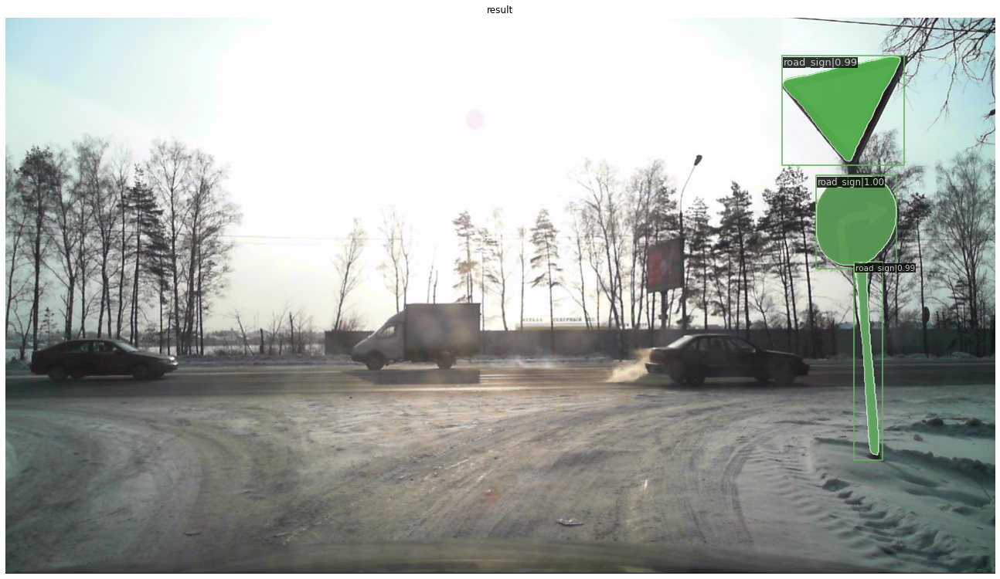

In [20]:
from mmdet.apis import inference_detector, show_result_pyplot

img = mmcv.imread(path + 'val/201.jpg')

model.cfg = cfg
result = inference_detector(model, img)
show_result_pyplot(model, img, result)

# Testing on real-world images

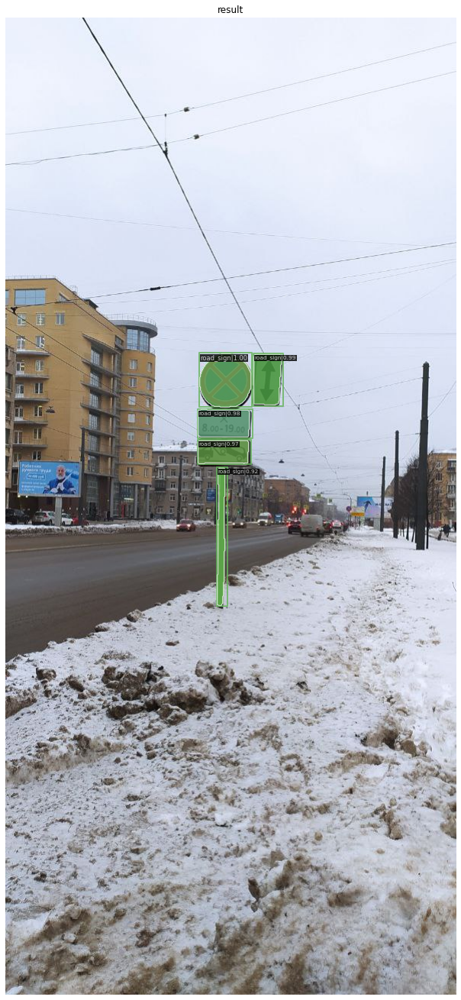

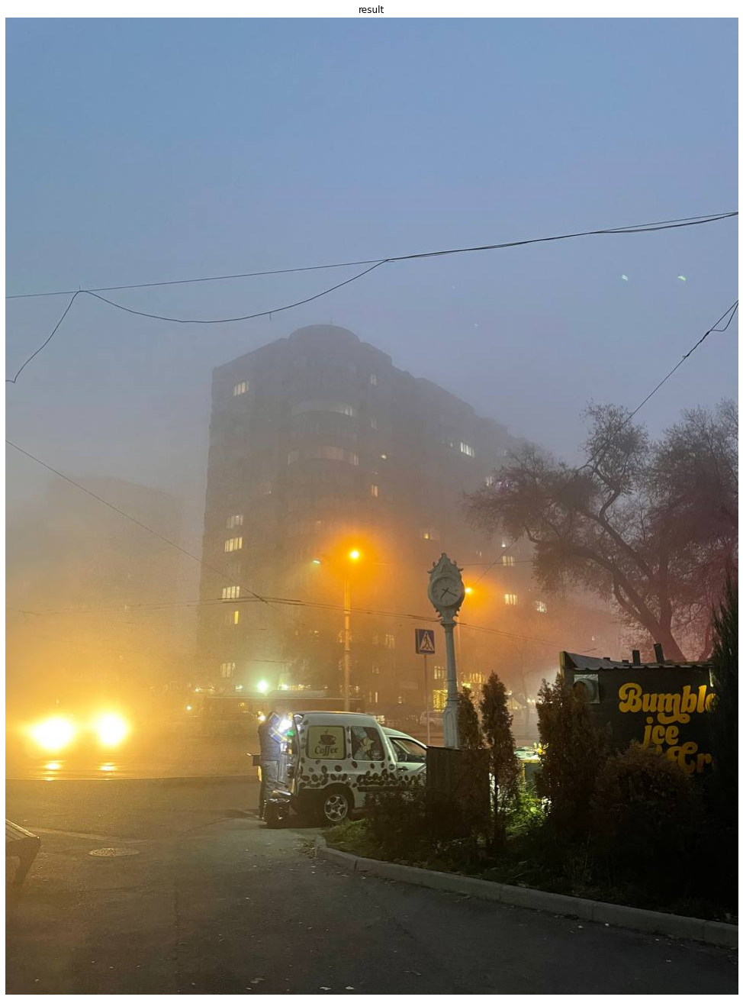

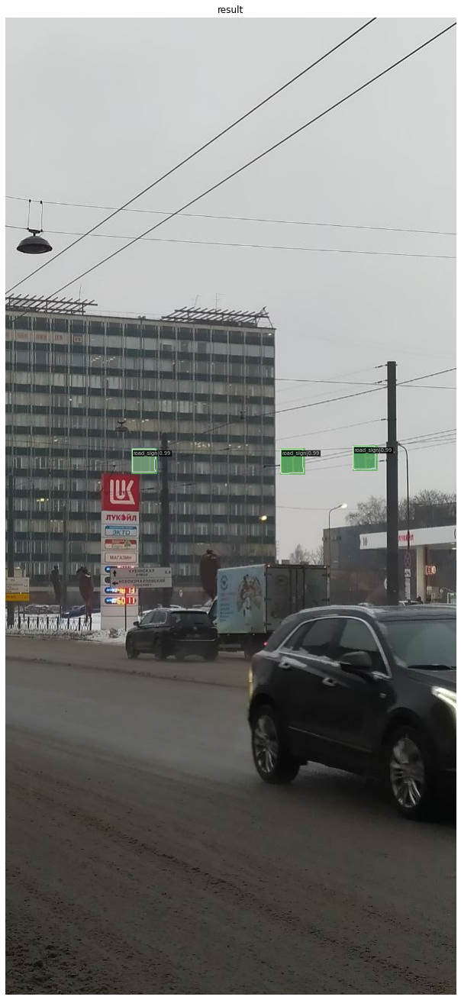

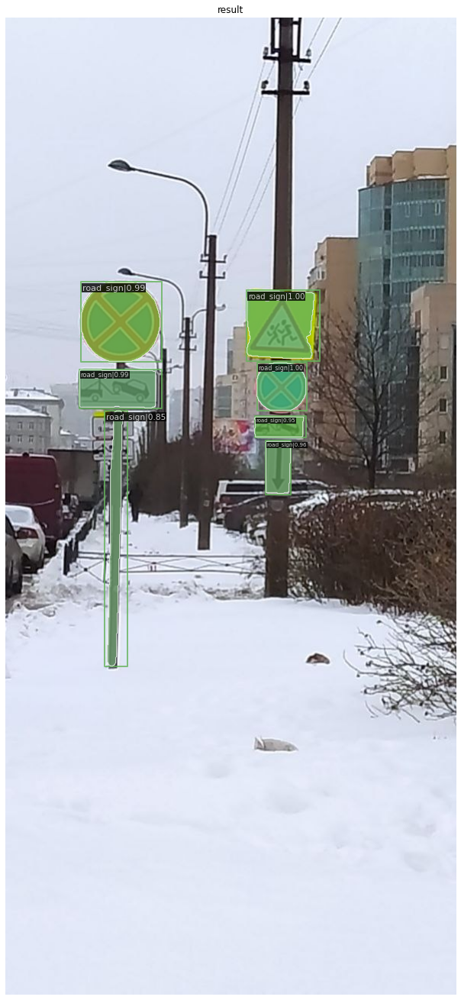

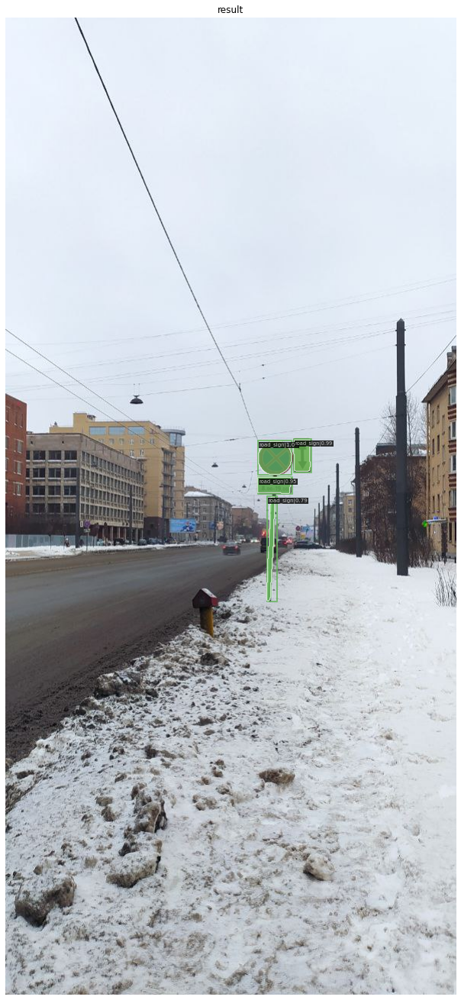

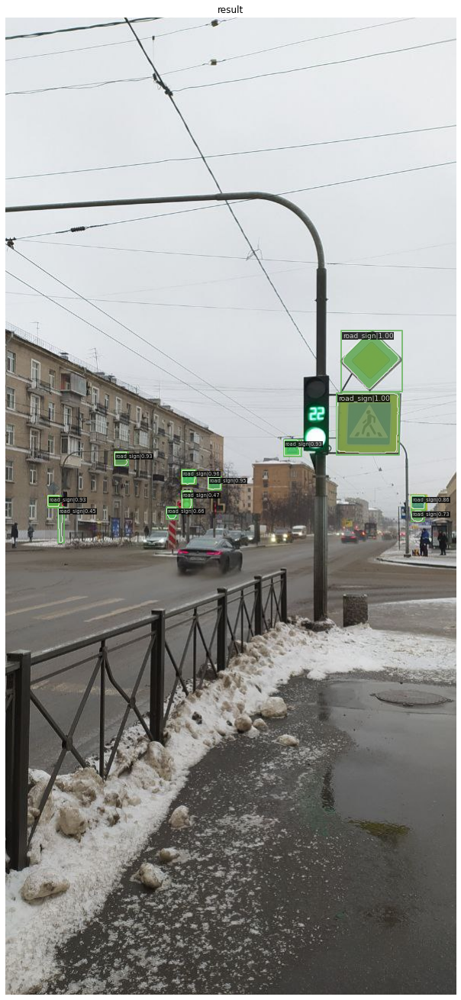

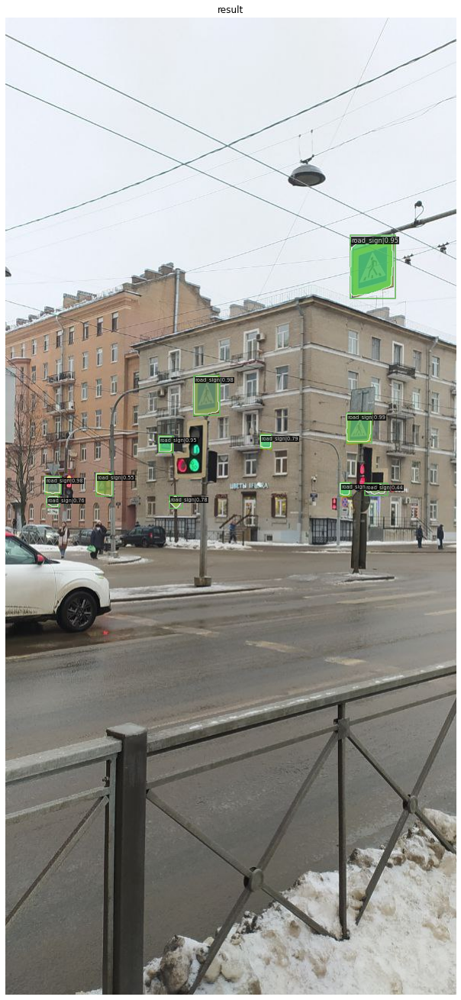

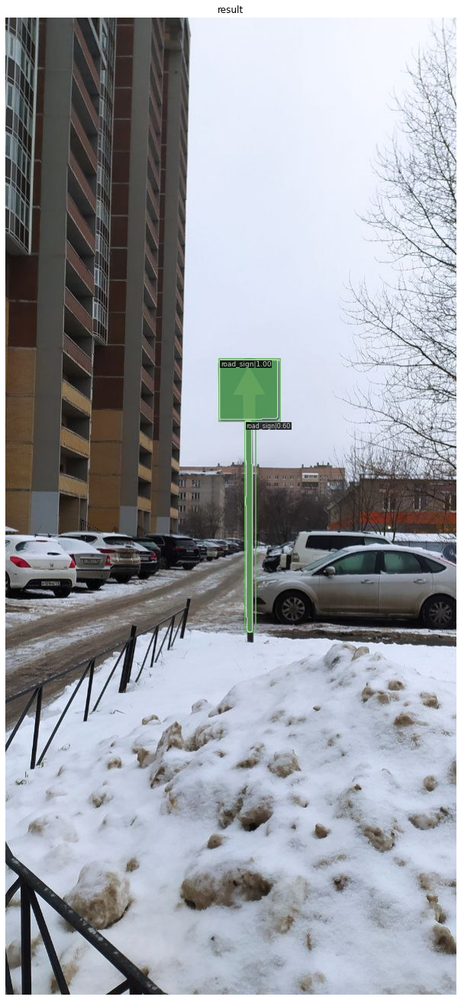

In [25]:
path = '/kaggle/input/testimages/real_world_images/'
for i in range(len(os.listdir(path))):
    image_path = path + os.listdir(path)[i]
    img = mmcv.imread(image_path)

    model.cfg = cfg
    result = inference_detector(model, img)
    show_result_pyplot(model, img, result)

# Loading saved model weights

In [194]:
# img = mmcv.imread('/kaggle/input/testimages/real_world_images/2022-12-21 11.53.19.jpg')
# checkpoint = 'checkpoints/epoch_6.pth'
# model = init_detector(cfg, checkpoint, device='cuda:0')
# result = inference_detector(model, img)
# show_result_pyplot(model, img, result)